This notebook will pull the data for a portfolio of assets listed in <asset_list> and then trade that
portfolio over a period of time using two trading strategies - 1) buy and hold and 2) portfolio rebalancing (starts with an equal $ split amongst the assets and periodically rebalances the holdings back to equal value).

It then runs 1000 trials where the start date, trading period and rebalancing period (for the rebalancing strategy) are randomised. Some plots showing the results are at the bottom of the notebook.

I wrote this to bring together some plot / analysis routines for when we actually impelement a real trader.

Following Alessandro's of idea of trading sectors, the example here is sector ETF's of US stocks in S&P500

Two of the ETF's are farily new - XLC & XLRE so if you want to trade an 11 ETF portfolio choose sector_etfs_2018.
If you want to trade the portfolio over a longer period (back to 2000) then choose the smaller sector_etfs_2000 which as the other 9 ETF's in it.

The code will go to Yahoo! finance and pull the daily data and save it to disk.  Then subsequent runs will just read this file from the disk.  It doesn't take long to get the data from Yahoo (seconds).


In [790]:
import pandas as pd
from pandas_datareader import data as web
import plotly.graph_objects as go
import os
import numpy as np
import datetime
import random
from random import randrange
from datetime import timedelta
from datetime import datetime

random.seed(0)

In [791]:
# SPDR Sector ETF's : Energy XLE, Materials XLB, Industrials XLI, Consumer Discretionary XLY, Consumer Staples XLP, 
# Healthcare XLV, Financials XLF, Information Technology XLK, Telecommunications Services XLC, Utilities XLU, Real Estate XLRE
sector_etfs_2018 = ['XLE', 'XLB', 'XLI', 'XLY', 'XLP', 'XLV', 'XLF', 'XLK', 'XLC', 'XLU', 'XLRE']
sector_etfs_2000 = ['XLE', 'XLB', 'XLI', 'XLY', 'XLP', 'XLV', 'XLF', 'XLK', 'XLU']

asset_list = sector_etfs_2000

In [792]:
# Iterate through asset list, check if we already have the data (load it) or go get it from Yahoo! (save it)
# Make a dictionary of dataframes containing all the data

start_date = '01-01-2000'
directory = 'yahoo_data'

# If the 'directory' doesn't exist, create it
if os.path.isdir(directory) == False:
    os.mkdir(directory)

asset_dict = {}

for asset in asset_list:
    pathname = directory + '/' + asset + '_' + start_date + '.csv'
    if os.path.isfile(pathname) == True:
        print('Loading from file: ', pathname)        
        df = pd.read_csv(pathname, index_col='Date')
    else:
        print('Downloading from Yahoo! - ', asset)
        df = web.DataReader(asset, data_source='yahoo', start=start_date)
        df.to_csv(pathname)    

    # Just before we put it in the dictionary, copy the index to a Date field and make a new index which enumerates
    # all the entries.
    df.insert(0, 'Date', df.index)
    df.index = np.arange(df.shape[0])
    df['Date']=pd.to_datetime(df['Date'], format='%Y/%m/%d')
    
    asset_dict[asset] = df 

Loading from file:  yahoo_data/XLE_01-01-2000.csv
Loading from file:  yahoo_data/XLB_01-01-2000.csv
Loading from file:  yahoo_data/XLI_01-01-2000.csv
Loading from file:  yahoo_data/XLY_01-01-2000.csv
Loading from file:  yahoo_data/XLP_01-01-2000.csv
Loading from file:  yahoo_data/XLV_01-01-2000.csv
Loading from file:  yahoo_data/XLF_01-01-2000.csv
Loading from file:  yahoo_data/XLK_01-01-2000.csv
Loading from file:  yahoo_data/XLU_01-01-2000.csv


In [793]:
# Pick an asset just to see example dataframe head and summary stats
display(asset_dict['XLE'].head())
display(asset_dict['XLE'].describe())
print(asset_dict['XLE'].dtypes)

,Date,High,Low,Open,Close,Volume,Adj Close
0,2000-01-03,27.31250,26.3750,27.3125,26.562500,380300.0,16.185848
1,2000-01-04,26.31250,25.8750,26.3125,26.062500,722200.0,15.881177
2,2000-01-05,26.75000,26.0000,26.1250,26.750000,337800.0,16.300108
3,2000-01-06,27.84375,26.7500,26.7500,27.781250,133100.0,16.928490
4,2000-01-07,28.40625,27.6875,27.6875,28.078125,468000.0,17.109398


,High,Low,Open,Close,Volume,Adj Close
count,5294.000000,5294.000000,5294.000000,5294.000000,5.294000e+03,5294.000000
mean,56.688544,55.600420,56.168115,56.155428,1.500691e+07,42.255754
std,20.158029,19.933476,20.053221,20.052415,1.254361e+07,17.041023
min,20.590000,19.379999,19.400000,19.799999,1.460000e+04,12.586147
25%,36.085000,35.269999,35.705001,35.730000,5.604950e+06,27.446990
50%,59.810001,58.735001,59.269999,59.320002,1.356020e+07,45.066383
75%,72.397501,71.160004,71.792501,71.747499,2.104870e+07,56.218622
max,101.519997,100.980003,101.239998,101.290001,9.935670e+07,78.235291


Date         datetime64[ns]
High                float64
Low                 float64
Open                float64
Close               float64
Volume              float64
Adj Close           float64
dtype: object


In [794]:
# Display a Plotly interactive candelstick chart

def plotly_candlestick(asset_dict, asset_name):

    df = asset_dict[asset_name]
    
    trace1 = {
        'x': df.Date,
        'open': df.Open,
        'close': df.Close,
        'high': df.High,
        'low': df.Low,
        'type': 'candlestick',
        'name': asset_name,
        'showlegend': True
    }

    data = [trace1]
        
    layout = go.Layout({
        'title': {
            'text': 'Asset: ' + asset_name,
            'font': {
                'size': 20
            }
        }
    })

    fig = go.Figure(trace1, layout)
    fig.show()


In [795]:
# Plot all the assets in Plotly interactive charts with a Candlestick chart
for asset in asset_list:
    plotly_candlestick(asset_dict, asset)

In [796]:
# Trading algorithm: Fully invested, periodic portfolio rebalance (FIPPR)
# Each trading period (specified in days), the portfolio is rebalanced to equal weighting at the open based on the previous 
# trading day's close. The previous days close is used to calculate the new positions (number of shares of each asset)
# The bot then goes to the market at the open to execute the trades.
# Note, the open vs close prices may differ so the portfolio may not balance precisely as expected

# test_asset_dict: Dictionary of dataframes. The key is the asset symbol e.g. 'SPY'. The value is a dataframe
#       containing the OHLC data + Date, Day (index) and adjusted close for that symbol over the test period.
# asset_list: list of asset symbols (str) in the porfolio
# rebalance_period: How often (in trading days) the algo rebalances the portfolio
# start_value: Starting value in $

def FIPPR(test_asset_dict, asset_list, rebalance_period = 1, start_value = 100000):
    debug = 0
  
    trade_cost_pct = 0.2 # percent each trade costs
    
    # Initialise portfolio - distribute the cash amongst all assets equally according to open price on 1st day of trading
    # Only allow integer stock quantities

    # Calculate approximate value available per asset (include trading cost allocation)
    value_per_asset = (start_value - (start_value * trade_cost_pct / 100.0)) / len(asset_list)

    if debug:
        print("Approx value available per asset: ${:1.0f}".format(value_per_asset))

    asset_positions = {}
    cash = start_value
    open_value = 0
    close_value = 0

    for asset in asset_list:
        open_price = test_asset_dict[asset]['Open'][0]
        close_price = test_asset_dict[asset]['Close'][0]
        num_shares = np.floor(value_per_asset / open_price)
    
        # Make the trade
        trade_value = num_shares * open_price
        trade_cost = trade_value * trade_cost_pct / 100.0
        asset_positions[asset] = num_shares
        cash = cash - trade_value - trade_cost

        if debug:
            # Print the transaction
            print(test_asset_dict[asset]['Date'][0], 'Bought: {:2.1f}'.format(num_shares), asset, 'shares at ${:4.3f}'.format(open_price), 
              'Cost: ${:1.1f}'.format(trade_value), 'plus fees ${:1.2f}'.format(trade_cost), 
              'Total: ${:1.2f}'.format(trade_value + trade_cost))

        # Keep a tally of the total opening and closing value of portfolio on first day
        open_value = open_value + trade_value
        close_value = close_value + (close_price * num_shares)
    
    bandh_cash_remaining = cash
    
    if debug:
        print('Opening value: ${:1.0f}'.format(open_value), 'Cash remaining: ${:1.0f}'.format(cash), 'Total: ${:1.0f}'.format(open_value + cash))
        print('Closing value: ${:1.0f}'.format(close_value), 'Cash remaining: ${:1.0f}'.format(cash), 'Total: ${:1.0f}'.format(close_value + cash))

    #  Keep a copy of the original allocations to compute a buy and hold baseline
    original_asset_positions = asset_positions.copy()  

    # Use an asset to walk through the trading days from the start to end
    # For each day we get the closing prices for all assets in the portfolio and compute a portfolio value
    # If it's a portfolio balancing day, we compute the new allocation for each asset to equalise value again (as much
    # as possible). We then go to the market the next trading day and execute the trades at the open.

    eval_daily_values = []
    bandh_daily_values = []
    eval_daily_holdings = []
    val_dates = []

    if debug:
        print(original_asset_positions)
        print(asset_positions)

    # iterate through each day in the test period
    for day in test_asset_dict[asset_list[0]].index:
    
        bandh_value = 0
        eval_value = 0

        # Cycle through all asset positions and calculate todays value (based on todays closing price)
        for asset in asset_list:
        
            df = test_asset_dict[asset]
            close_price = df['Close'].loc[day]
        
            # First, compute the baseline algo (buy-and-hold) value       
            num_shares = original_asset_positions[asset]
            bandh_value = bandh_value + (close_price * num_shares)

            # Second, compute the trading algo evaluation value       
            num_shares = asset_positions[asset]
            eval_value = eval_value + (close_price * num_shares)

        # Append new values to lists for plotting later
        bandh_daily_values.append(bandh_value + bandh_cash_remaining)
        eval_daily_values.append(eval_value + cash)
        eval_daily_holdings.append(asset_positions.copy())
        val_dates.append(df['Date'].loc[day])
    
        # Is this a rebalance day?
        if day % rebalance_period == 0 and day > 0:
            if debug:
                print("Rebalance Portfolio: ", day, df['Date'].loc[day])
 
            # Total value of portfolio (before transaction costs)
            total_value = eval_value + cash

            # Estimate the transaction costs as 10% of buying entire porfolio x 2 (sell and buy)
            # The real solution of spending all possible resources is a dynamic programming problem - TBD
            estimated_trans_costs = 2 * total_value * trade_cost_pct / 1000.0
        
            value_per_asset = (total_value - estimated_trans_costs) / len(asset_list)

            if debug:
                print("Approx value available per asset: ${:1.0f}".format(value_per_asset))
   
            for asset in asset_list:
                # Get next session opening price
                open_price = test_asset_dict[asset]['Open'].loc[day+1]
            
                # Compute the new number of shares for this asset at the open price
                num_shares = np.floor(value_per_asset / open_price)
    
                # Compare to the existing holding and compute net trade to execute
                diff = num_shares - asset_positions[asset]
            
                # Compute trade value
                trade_value = diff * open_price
            
                # Compute the cost of trade
                trade_cost = abs(trade_value) * trade_cost_pct / 100.0
            
                # Adjust the position
                asset_positions[asset] = asset_positions[asset] + diff
            
                # Compute new cash holding (trade value is -ve if a sale)
                cash = cash - trade_value - trade_cost
              
                if debug:
                    # Print the transaction (for debug)
                    print(day, test_asset_dict[asset]['Date'][day], 'Bef:${:1.0f}'.format((asset_positions[asset]-diff) * open_price), 
                          'Bought: {:2.1f}'.format(diff), asset, 'shares at ${:4.3f}'.format(open_price), 
                          'Cost: ${:1.1f}'.format(trade_value), 'plus fees ${:1.2f}'.format(trade_cost), 
                          'Total: ${:1.2f}'.format(trade_value + trade_cost), 
                          'Aft:${:1.0f}'.format(asset_positions[asset] * open_price), 'Cash:${:1.0f}'.format(cash))

        if debug:
            print(day, df['Date'].loc[day], '${:1.0f}'.format(bandh_value), '${:1.0f}'.format(eval_value))
        
        # Need to stop 1 day before the end of the trading period
        if day >= (len(df) - 2):
            break

    summary_stats = {}
    
    # Compute summary statistics
    summary_stats['base_return'] = 100.0 * (bandh_daily_values[-1] - start_value) / start_value
    summary_stats['base_max_dd'] = 100.0 * (max(bandh_daily_values) - min(bandh_daily_values)) / max(bandh_daily_values) 

    summary_stats['eval_return'] = 100.0 * (eval_daily_values[-1] - start_value) / start_value
    summary_stats['eval_max_dd'] = 100.0 * (max(eval_daily_values) - min(eval_daily_values)) / max(eval_daily_values)
    
    # Save all the daily computed data
    summary_stats['bandh_daily_values'] = bandh_daily_values
    summary_stats['eval_daily_values'] = eval_daily_values
    summary_stats['eval_daily_holdings'] = eval_daily_holdings
    summary_stats['val_dates'] = val_dates
    
    if debug:
        print("Baseline: End value: ${:1.0f}".format(bandh_daily_values[-1]),'Return: {:1.3f}%'.format(baseline_return))
        print("Evaluation: End value: ${:1.0f}".format(eval_daily_values[-1]),'Return: {:1.3f}%'.format(eval_return))
    
    return summary_stats
    

In [797]:
# This code is cut and pasted from StackOverflow

def random_date(start, end):
    """
    This function will return a random datetime between two datetime 
    objects.
    """
    delta = end - start
        
    int_delta = (delta.days * 24 * 60 * 60) + delta.seconds
    random_second = randrange(int_delta)
    return start + timedelta(seconds=random_second)


In [798]:
# This cell runs the trials - randomises the start date, stop date and rebalancing period.

num_trials = 1000

from datetime import datetime

trials = []
pd.set_option('display.max_rows', 5000)

for run in range(0 , num_trials):
    d1 = datetime.strptime('1/1/2000', '%m/%d/%Y')
    d2 = datetime.strptime('12/31/2020', '%m/%d/%Y')

    while True:
        start_date = random_date(d1, d2)
        stop_date = random_date(start_date, d2)

        if (stop_date - start_date).days > 10:
            break

    
    # Create a new dictionary of assets where only data within the test date range is present
    for asset in asset_list:
        df = asset_dict[asset]
        mask = (df['Date'] > start_date) & (df['Date'] <= stop_date)
        test_asset_dict[asset] = df.loc[mask]
        if len(test_asset_dict[asset]) == 0:
            print(df)
            print(mask)
        test_asset_dict[asset].index = np.arange(test_asset_dict[asset].shape[0])
        
    
    rebalance_period = randrange(1, 265)    
    result_dict = FIPPR(test_asset_dict, asset_list, period, 100000)
    result_dict['trade_period'] = (stop_date - start_date).days
    result_dict['rebalance_period'] = rebalance_period
    result_dict['diff'] = result_dict['eval_return'] - result_dict['base_return']
    result_dict['start_date'] = start_date
    
    print(run)

    # Add result to list of results
    trials.append(result_dict)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

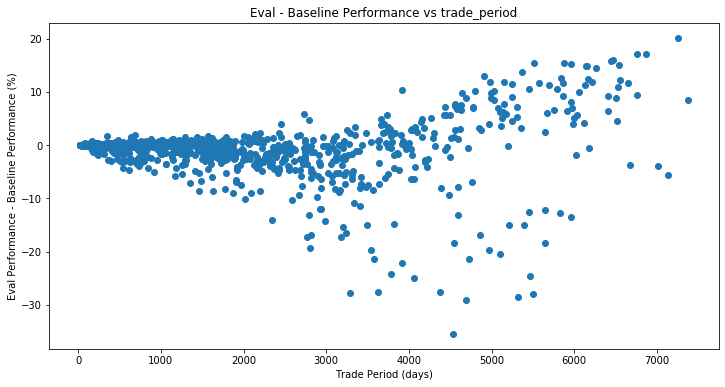

In [799]:
x = [item['trade_period'] for item in trials]
y = [item['diff'] for item in trials]

fig = plt.figure(figsize=(12, 6))
plt.title("Eval - Baseline Performance vs trade_period")
plt.xlabel("Trade Period (days)")
plt.ylabel("Eval Performance - Baseline Performance (%)")
plt.scatter(x, y)
plt.show()


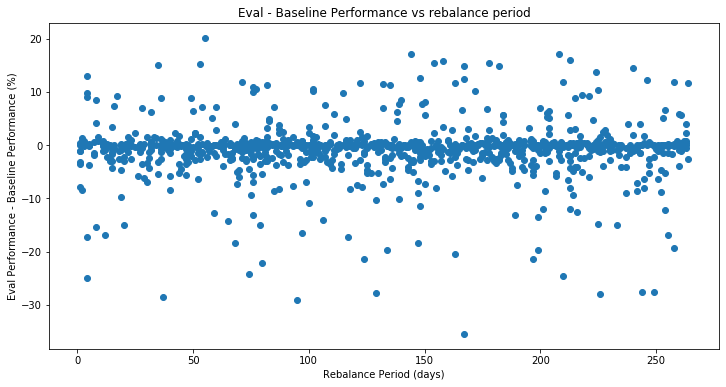

In [800]:
x = [item['rebalance_period'] for item in trials]
y = [item['diff'] for item in trials]

fig = plt.figure(figsize=(12, 6))
plt.title("Eval - Baseline Performance vs rebalance period")
plt.xlabel("Rebalance Period (days)")
plt.ylabel("Eval Performance - Baseline Performance (%)")
plt.scatter(x, y)
plt.show()


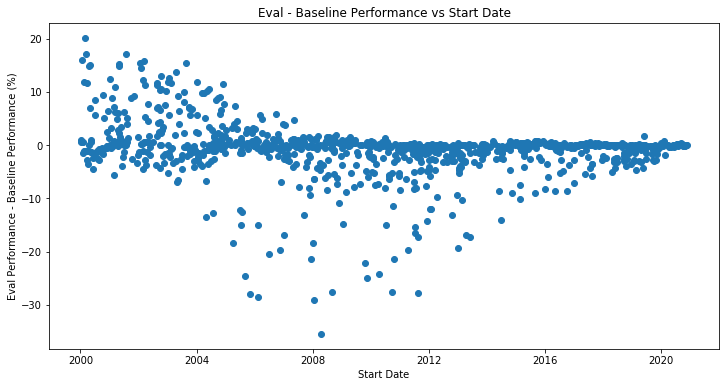

In [801]:
x = [item['start_date'] for item in trials]
y = [item['diff'] for item in trials]

fig = plt.figure(figsize=(12, 6))
plt.title("Eval - Baseline Performance vs Start Date")
plt.xlabel("Start Date")
plt.ylabel("Eval Performance - Baseline Performance (%)")
plt.scatter(x, y)
plt.show()

In [814]:
# Find some of the interesting trials
eval_returns = np.array([item['eval_return'] for item in trials])
print("Best eval return was {:1.2f}%".format(max(eval_returns)), "at trial", np.argmax(eval_returns))
print("Worst eval return was {:1.2f}%".format(min(eval_returns)), "at trial", np.argmin(eval_returns))

base_returns = np.array([item['base_return'] for item in trials])
print("Best baseline return was {:1.2f}%".format(max(base_returns)), "at trial", np.argmax(base_returns))
print("Worst baseline return was {:1.2f}%".format(min(base_returns)), "at trial", np.argmin(base_returns))

diff_returns = np.array([item['diff'] for item in trials])
print("Best differential return was {:1.2f}%".format(max(diff_returns)), "at trial", np.argmax(diff_returns))
print("Worst differential return was {:1.2f}%".format(min(diff_returns)), "at trial", np.argmin(diff_returns))



Best eval return was 299.02% at trial 233
Worst eval return was -48.95% at trial 966
Best baseline return was 299.62% at trial 233
Worst baseline return was -46.00% at trial 966
Best differential return was 20.19% at trial 548
Worst differential return was -35.47% at trial 16


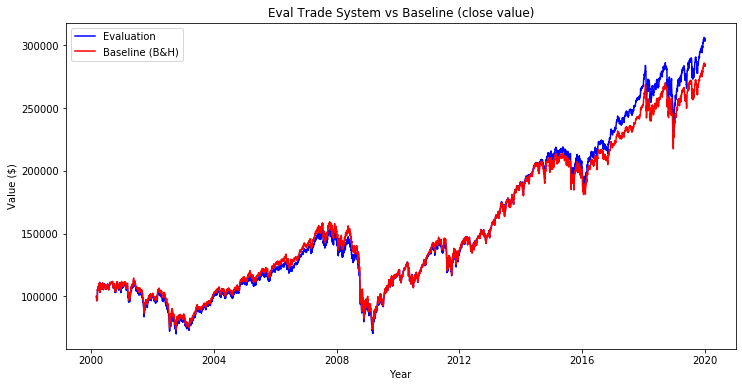

In [818]:
# Plot the values of both strategies over time for a single trial

trial_num = 548

eval_daily_values = trials[trial_num]['eval_daily_values']
bandh_daily_values = trials[trial_num]['bandh_daily_values']
# x = np.arange(len(eval_daily_values)) # Trade day number
x = pd.to_datetime(trials[trial_num]['val_dates'], format='%Y/%m/%d') # Date

import matplotlib.pyplot as plt
%matplotlib inline

x1 = x
y1 = eval_daily_values
y2 = bandh_daily_values

fig = plt.figure(figsize=(12, 6))
plt.title("Eval Trade System vs Baseline (close value)")
plt.xlabel("Year")
plt.ylabel("Value ($)")

plt.plot(x1,y1, color = 'blue', label='Evaluation')
plt.plot(x1,y2, color = 'red', label = 'Baseline (B&H)')

plt.legend()
plt.show()

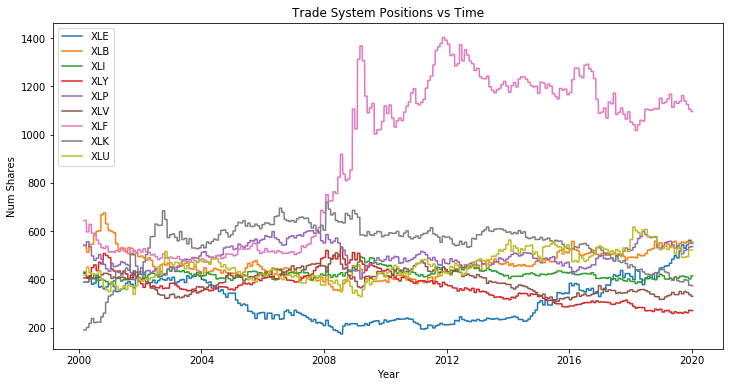

In [816]:
# Ignore cell for now
# Plot the holdings of the buy and hold both strategy over time for a single trial

trial_num = 548

eval_daily_holdings = trials[trial_num]['eval_daily_holdings']

# x = np.arange(len(eval_daily_values)) # Trade day number
x = pd.to_datetime(trials[trial_num]['val_dates'], format='%Y/%m/%d') # Date

x1 = x
# x1 = x[0:len(eval_daily_values)]

fig = plt.figure(figsize=(12, 6))
plt.title("Trade System Positions vs Time")
plt.xlabel("Year")
plt.ylabel("Num Shares")

for asset in asset_list:
    y = [item[asset] for item in eval_daily_holdings]
    plt.plot(x1, y, label=asset)

plt.legend()